#Automatic Port Operations

Author :  Sundar Krishnamachari

**Objectives**

*  Identify different classes of boats using a Covolutional Neural Network model
*  Identify different classes of boats using the MobileNet_V2 model using transfer learning
*   Compare the performanaces of both and draw inferences


---


**Tasks performed on each model**
1.  Evaluate Model's performance by calculating accuracy and loss metrics
2.  Make predictions on the test set
3.  Print confusion matrix and display
4.  Print classificaton report
   

##Common Functions

In [ ]:
import os
import pathlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import seaborn as sns
import pandas as pd

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay,classification_report

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from  tensorflow.keras.models import Sequential

import warnings
warnings.filterwarnings('ignore')

train_accuracy = {}
test_accuracy = {}
train_loss = {}
test_loss = {}


def print_scores(model, val_ds, train_ds,name='Default'):
    """
    :param model:
    :param val_ds:
    :param train_ds:
    :return:
    """
    print(f'Displaying accuracy and loss for {name}')

    score_test = model.evaluate(val_ds, verbose=0)
    score_train = model.evaluate(train_ds, verbose=0)

    print('Test loss:%.4f' % score_test[0])
    print('Test accuracy:%.4f' % score_test[1])

    print('Train loss:%.4f' % score_train[0])
    print('train accuracy:%.4f' % score_train[1])

    if not name == 'Default':
      test_loss[name] = score_test[0]
      test_accuracy[name] = score_test[1]
      train_loss[name] = score_train[0]
      train_accuracy[name] = score_train[1]



def _plot(history, param_1,param_2,ax):

    """
    :param history:
    :param param_1:
    :param param_2:
    :return:
    """

    ax.plot(history.history[param_1])
    ax.plot(history.history[param_2])
    ax.set_title(f'model {param_1}')
    ax.set_ylabel(param_1)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'test'], loc='best')


def plot_accuracy_loss_graphs(history, title=None, show=True):
    """
    :param history:
    :param title:
    :param show:
    :return:
    """
    print()
    fig = plt.figure(figsize=(10, 10))

    # accuracy chart
    ax = plt.subplot(1, 2, 1)
    _plot(history,'accuracy','val_accuracy',ax)
    # loss chart
    ax = plt.subplot(1, 2, 2)
    _plot(history,'loss','val_loss',ax)
    if show:
        plt.tight_layout()
        plt.show()
    else:
        plt.savefig(f'{title}.png')
        plt.close()


def get_predicted_labels(model,class_names):
    """
    :param model:
    :param class_names:
    :return: dict of image paths and image labels
    """
    images = os.listdir(test_dir)
    image_label_map = {}


    for i, image in enumerate(images):
        path = test_dir + '/' + image
        img = tf.keras.utils.load_img(path, target_size=(height, width))
        img_array = tf.keras.utils.img_to_array(img)
        img_array = tf.expand_dims(img_array, 0)  # Create a batch
        predictions = model.predict(img_array, verbose=False)
        score = tf.nn.softmax(predictions[0])
        max_score = np.max(score)
        image_label_map[path] = class_names[np.argmax(score)]
    return image_label_map


def display_test_images(image_map, model_name):
    """

    :param image_map:
    :param model_name:
    :return:
    """
    print(f'Predictions for {model_name}\n')
    plt.figure(figsize=(25, 25))
    for i, image_path in enumerate(image_map.keys()):
        ax = plt.subplot(20, 15, i + 1)
        img = mpimg.imread(image_path)
        ax.imshow(img)
        ax.axis('off')
        label = image_map.get(image_path)
        # ax.text(0.5, .8, label, fontsize=10, fontweight='' color='green', ha='center', va='center',transform=ax.transAxes)
        ax.set_title(label, fontsize=10)
    plt.show()


def display_cm(true_labels, predicted_labels):
    """
    :param true_labels:
    :param predicted_labels:
    :return:
    """
    cm = confusion_matrix(true_labels, predicted_labels)
    print('Confusion Matrix')
    print(cm)
    print()

    print('Confusion Matrix Displayed\n')
    fig = plt.figure(figsize=(10, 10))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot()
    plt.title('Confusion Matrix')
    plt.xticks(rotation=90)
    plt.show()


def get_metrics(model, validation_ds, val_split=0.2):
    num_images = int(total_train_images * val_split)
    num_batches = int(num_images / 32)
    residuals = int(num_images % 32)
    true_labels = []
    predicted_labels = []
    for images, labels in validation_ds.take(num_batches):
        true_labels.extend(labels)
        for i in range(batch_size):  # prediction for each image in the batch
            img_array = tf.keras.utils.img_to_array(images[i])
            img_array = tf.expand_dims(img_array, 0)  # Create a batch
            predictions = model.predict(img_array, verbose=False)
            score = tf.nn.softmax(predictions[0])
            predicted_labels.append(np.argmax(score))
    return true_labels, predicted_labels


def create_transfer_model(transfer_model, dropout=0.1, trainable=False, data_augmentation=None):
    transfer_model.trainable = trainable
    model_t = Sequential()
    if not data_augmentation is None:
        for aug in data_augmentation:
            print(f'added {aug} to model')
            model_t.add(aug)
    if data_augmentation is None:
        # data augmentation will add an input shape in the first layer
        model_t.add(layers.Rescaling(1. / 255, input_shape=(height, width, 3)))
    else:
        model_t.add(layers.Rescaling(1. / 255))
    model_t.add(transfer_model)
    model_t.add(layers.GlobalAveragePooling2D())
    model_t.add(layers.Dropout(dropout))


    # FCN
    model_t.add(layers.Flatten())
    model_t.add(layers.Dense(256, activation='relu'))
    model_t.add(layers.BatchNormalization())
    model_t.add(layers.Dropout(dropout))

    model_t.add(layers.Dense(128, activation='relu'))
    model_t.add(layers.BatchNormalization())
    model_t.add(layers.Dropout(dropout))

    model_t.add(layers.Dense(len(class_names), activation='softmax'))
    model_t.summary()
    return model_t


##CNN Model

##Load Datasets

In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


##Extract data

In [3]:
# from zipfile import ZipFile


# zip_ref = ZipFile('/content/drive/MyDrive/DL/BOATS.zip','r')
# zip_ref.extractall('/content/drive/MyDrive/DL')
# zip_ref.close()



##Define constants , test and train directories

In [4]:
# lets define some constants
train_dir_kaggle = '/kaggle/input/boats-ds/TRAIN_BOATS'
test_dir_kaggle = '/kaggle/input/boats-ds/TEST_BOATS'


train_dir_colab = '/content/drive/MyDrive/DL/TRAIN_BOATS/'
test_dir_colab = '/content/drive/MyDrive/DL/TEST_BOATS/'

train_dir = train_dir_colab
test_dir = test_dir_colab

if os.path.exists(train_dir_kaggle):
  train_dir = train_dir_kaggle
  test_dir = test_dir_kaggle
  print('Using Kaggle data')
  print(f'train_dir = {train_dir}')
  print(f'test_dir = {test_dir}')
else:
  print('Using Colab data')
  print(f'train_dir = {train_dir}')
  print(f'test_dir = {test_dir}')


height = 224
width = 224
batch_size = 32
total_train_images = 0

total_test_images = len(os.listdir(test_dir))


for sub_dir in os.listdir(train_dir):
  total_train_images += len(os.listdir(train_dir+'/'+sub_dir))

print('total train images = ', total_train_images)
print('total test images =  ', total_test_images)


Using Colab data
train_dir = /content/drive/MyDrive/DL/TRAIN_BOATS/
test_dir = /content/drive/MyDrive/DL/TEST_BOATS/
total train images =  1162
total test images =   300


##Estimate number of images per class and plot

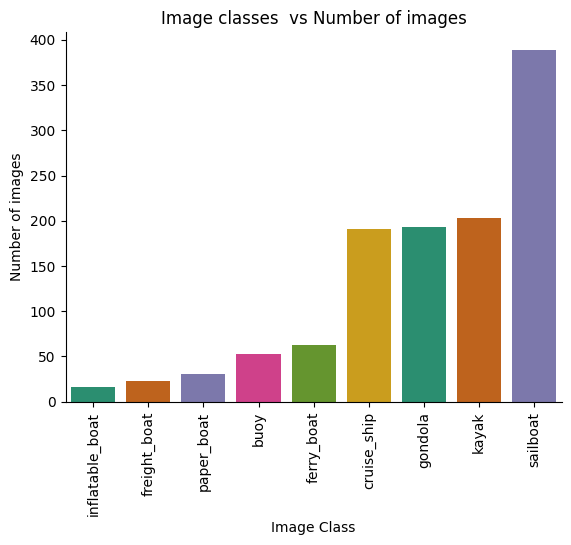

,index,Image_Class,Num_Images
0,5,inflatable_boat,16
1,3,freight_boat,23
2,7,paper_boat,31
3,0,buoy,53
4,2,ferry_boat,63
5,1,cruise_ship,191
6,4,gondola,193
7,6,kayak,203
8,8,sailboat,389


In [5]:

data_dir = pathlib.Path(train_dir)

def get_subdirectories(directory):
    with os.scandir(directory) as entries:
        return [entry.name for entry in entries if entry.is_dir()]
sub_dirs = get_subdirectories(data_dir)
images = {}
image_class = []
num_images = []
class_dict = {}

for d in sub_dirs:
    image_class.append(d)
    num_images.append(len(os.listdir(train_dir+'/'+d)))

df = pd.DataFrame({'Image_Class':image_class,'Num_Images':num_images}).sort_values(by='Num_Images',ascending=True).reset_index()

indices = sorted(df['index'].values.tolist())
class_names = df['Image_Class'].values
for i in indices:
  class_dict[i] = class_names[i]
sns.barplot(data=df,x='Image_Class',y='Num_Images',palette=sns.mpl_palette('Dark2'))
plt.xlabel('Image Class')
plt.ylabel('Number of images')
plt.title(f'Image classes  vs Number of images' )
plt.xticks(rotation = 90)
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.show()
df

There is a predominence of the sailboat class in the training data. The bottom three image classes have less then 50 images per class. Ideally we can drop them. Having them in the training/testing datasets can skew the predictions. But, I am keeping them nonetheless.

##Define datasets for training and validatating the model

In [6]:
# Not using ImageDataGenerator as it is deprecated and it doesnt allow for
# caching and prefetching. With image data, caching and prefetcing can determine
# if training will be possible with limited gpu resources

# https://www.tensorflow.org/guide/data

import tensorflow as tf

def get_ds(data_dir,validation_split=0.2,subset='training',seed = 43,image_size=(255,255),batch_size=32):
    train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=validation_split,
    subset=subset,
    seed=seed,
    image_size=image_size,
    batch_size=batch_size)
    train_ds.class_names
    return train_ds

train_ds = get_ds(data_dir,image_size=(height,width),batch_size=batch_size)
val_ds = get_ds(data_dir,validation_split=0.2,subset='validation',seed = 43,image_size=(height,width),batch_size=batch_size)
class_names = train_ds.class_names
print(class_names)


Found 1162 files belonging to 9 classes.
Using 930 files for training.
Found 1162 files belonging to 9 classes.
Using 232 files for validation.
['buoy', 'cruise_ship', 'ferry_boat', 'freight_boat', 'gondola', 'inflatable_boat', 'kayak', 'paper_boat', 'sailboat']


##Plot some images from the training dataset

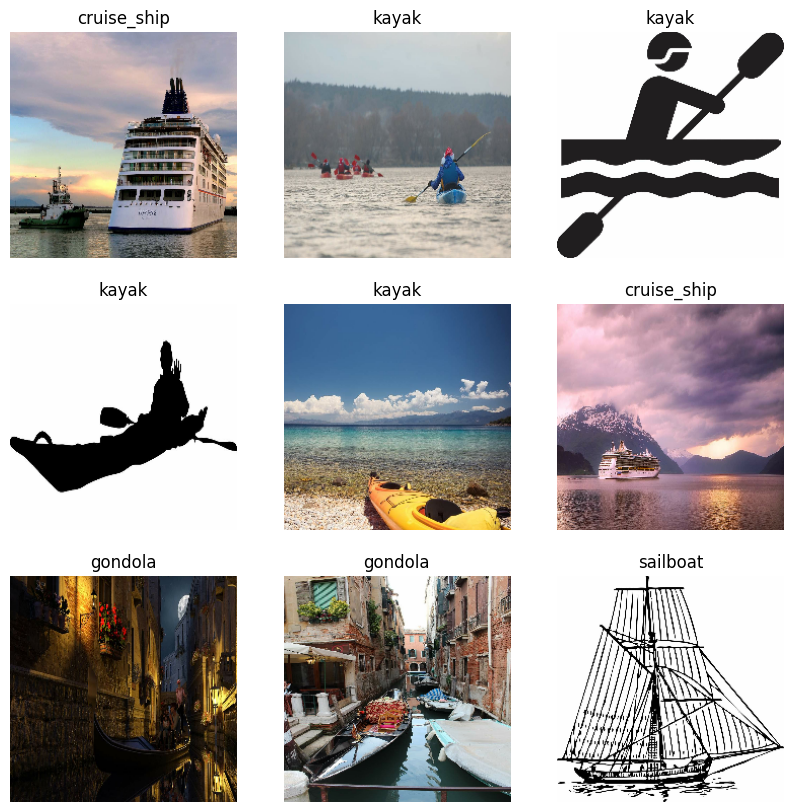

In [7]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

##Set up the datasets for caching and prefetching

In [8]:
# Using `cache`, `prfetch` and `AUTOTUNE` for efficient handling of input data.
# https://www.tensorflow.org/guide/data_performance
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

##CNN model exactly as specfied in the problem
 2 Conv2d layers with Max 2d pooling

 1 2D Global Average Pooling

 2 FFN with 2 dense layers of 128 neurons each

 1 outpt layer with 9 neurons and softmax activation

In [9]:


model = Sequential([

  # Image Scaling layer
  layers.Rescaling(1./255, input_shape=(height, width, 3)),

  # First convolution layer.convolution with 32 filters with a 3x3 kernel matrix,no padding
  layers.Conv2D(32, (3,3),  activation='relu'),
  layers.MaxPooling2D(),
  #layers.Dropout(0.1),

  # Second Convolution layer
  layers.Conv2D(32, (3,3),  activation='relu'),
  layers.MaxPooling2D(),

  #Global Average Pooling
  layers.GlobalAveragePooling2D(),

  # FFN
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(128, activation='relu'),
  layers.Dense(len(class_names),activation='softmax')

])




##Compile the model

In [10]:
model.compile(optimizer='adam',
              #https://www.tensorflow.org/api_docs/python/tf/keras/losses/CategoricalCrossentropy
              #It states:
              # "We expect labels to be provided in a one_hot representation.
              #  If you want to provide labels as integers, please use SparseCategoricalCrossentropy loss."
              loss = 'sparse_categorical_crossentropy',
              # keras has removed support for batch level precision and recall metrics.Problem statement is obsolate
              metrics=['accuracy']
             )
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)                │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 32)                  │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │           4,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 9)                   │           1,161 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 32,041 (125.16 KB)

 Trainable params: 32,041 (125.16 KB)

 Non-trainable params: 0 (0.00 B)

## Train the model with Early Stopping and Checkpoint

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint

#Optimizing for maximum accuracy instead of minimum loss.( min loss does not always mean max accuracy)
early_stop=EarlyStopping(monitor='val_accuracy',mode='max',verbose=1,patience=10,min_delta=0.01)
checkpoint=ModelCheckpoint('best_model.keras',monitor='val_accuracy',mode='max',verbose=1,save_best_only=True)

epochs=100
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  batch_size = batch_size,
  # not specified. But i thought this was a good idea
  callbacks = [early_stop,checkpoint]
)

Epoch 1/100
29/30 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.2852 - loss: 2.0488
Epoch 1: val_accuracy improved from -inf to 0.30172, saving model to best_model.keras
30/30 ━━━━━━━━━━━━━━━━━━━━ 185s 1s/step - accuracy: 0.2881 - loss: 2.0421 - val_accuracy: 0.3017 - val_loss: 1.8125
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.3327 - loss: 1.8598
Epoch 2: val_accuracy did not improve from 0.30172
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.3330 - loss: 1.8580 - val_accuracy: 0.3017 - val_loss: 1.7931
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.3450 - loss: 1.7445
Epoch 3: val_accuracy did not improve from 0.30172
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.3449 - loss: 1.7460 - val_accuracy: 0.3017 - val_loss: 1.7872
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.3387 - loss: 1.7577
Epoch 4: val_accuracy did not improve from 0.30172
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.3390 - loss: 1.

##Print the metrics

**loss and accuracy graphs are plotted for all models in one graph later**

In [ ]:
from tensorflow.keras.models import load_model
model = load_model('best_model.keras')
print_scores(model,val_ds,train_ds)

Displaying accuracy and loss for Default
Test loss:1.4841
Test accuracy:0.4828
Train loss:1.3976
train accuracy:0.5247


##Modified CNN Model

In [ ]:


model = Sequential([
  # Rescaling  images
  layers.Rescaling(1./255, input_shape=(height, width, 3)),

  # First convolution layer.convolution with 32 filters with a 3x3 kernel matrix
  layers.Conv2D(32, (3,3), padding='same', activation='relu'),
  layers.MaxPooling2D(), # Use max pooling
  layers.Dropout(0.1),

  # Second Convolution layer
  layers.Conv2D(32, (3,3), padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.1),

  # 3rd Convolution layer
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.1),

  # 4th Convolution layer
  layers.Conv2D(128, 3, padding='same', activation='relu'),
  layers.GlobalAveragePooling2D(),
  layers.Dropout(0.1),

  #FCN
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(128, activation='relu'),
  layers.Dropout(0.2),
  layers.Dense(len(class_names),activation='softmax')

])


##Compile the model

In [ ]:
model.compile(optimizer='adam',
              #https://www.tensorflow.org/api_docs/python/tf/keras/losses/CategoricalCrossentropy
              #It states:
              # "We expect labels to be provided in a one_hot representation.
              #  If you want to provide labels as integers, please use SparseCategoricalCrossentropy loss."
              loss = 'sparse_categorical_crossentropy',
              # keras has removed support for batch level precision and recall metrics.Problem statement is obsolate
              metrics=['accuracy']
             )
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 112, 112, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 56, 56, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 56, 56, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 56, 56, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 28, 28, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 28, 28, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 128)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 9)                   │           1,161 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 136,681 (533.91 KB)

 Trainable params: 136,681 (533.91 KB)

 Non-trainable params: 0 (0.00 B)

##Train the model

In [ ]:
histories = []

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint

early_stop=EarlyStopping(monitor='val_accuracy',mode='max',verbose=1,patience=10,min_delta=0.01)
checkpoint=ModelCheckpoint('best_model.keras',monitor='val_accuracy',mode='max',verbose=1,save_best_only=True)

epochs=100
history_c = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  batch_size = batch_size,
  callbacks = [early_stop,checkpoint]
)

histories.append(history_c)

Epoch 1/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - accuracy: 0.3032 - loss: 2.0114
Epoch 1: val_accuracy improved from -inf to 0.30172, saving model to best_model.keras
30/30 ━━━━━━━━━━━━━━━━━━━━ 16s 242ms/step - accuracy: 0.3037 - loss: 2.0085 - val_accuracy: 0.3017 - val_loss: 1.8247
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.3535 - loss: 1.8137
Epoch 2: val_accuracy did not improve from 0.30172
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - accuracy: 0.3530 - loss: 1.8145 - val_accuracy: 0.3017 - val_loss: 1.8503
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.3515 - loss: 1.8248
Epoch 3: val_accuracy did not improve from 0.30172
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.3511 - loss: 1.8244 - val_accuracy: 0.3017 - val_loss: 1.7972
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.3525 - loss: 1.7807
Epoch 4: val_accuracy did not improve from 0.30172
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.3522 - loss:

##Print Metrics


In [ ]:
from tensorflow.keras.models import load_model
model = load_model('best_model.keras')
print_scores(model,val_ds,train_ds,'CNN Model')

Displaying accuracy and loss for CNN Model
Test loss:1.2901
Test accuracy:0.6121
Train loss:1.1262
train accuracy:0.6409


##Display the predictions

Predictions for CNN Model. Title is the predicted label



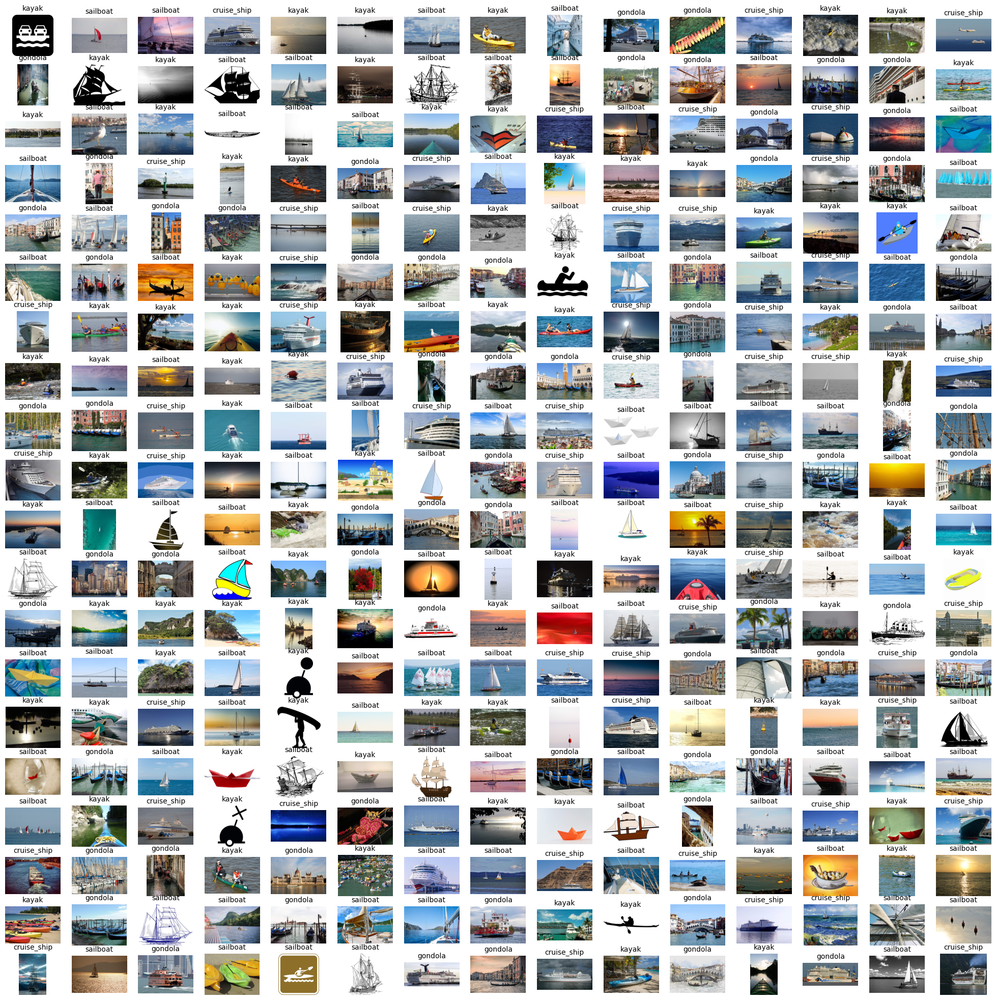

In [ ]:
image_map = get_predicted_labels(model,class_names)
display_test_images(image_map,'CNN Model. Title is the predicted label')

Notice how classes with very few images in training set tend to get misclassified. sailboat , which has the largest number of images is the best predicted class

##Confusion Matrix

##Get the predicted and True labels

In [ ]:
true_labels, predicted_labels = get_metrics(model,val_ds)

##Display Confusion Matrix

Confusion Matrix
[[ 0  2  0  0  0  0  8  0  3]
 [ 0 33  0  0  3  0  5  0  4]
 [ 0  9  0  0  1  0  2  0  3]
 [ 0  0  0  0  0  0  1  0  2]
 [ 0  1  0  0 25  0  3  0  4]
 [ 0  0  0  0  0  0  2  0  0]
 [ 0  3  0  0  3  0 30  0  7]
 [ 0  0  0  0  0  0  2  0  1]
 [ 0  8  0  0  4  0  8  0 47]]

Confusion Matrix Displayed



<Figure size 1000x1000 with 0 Axes>

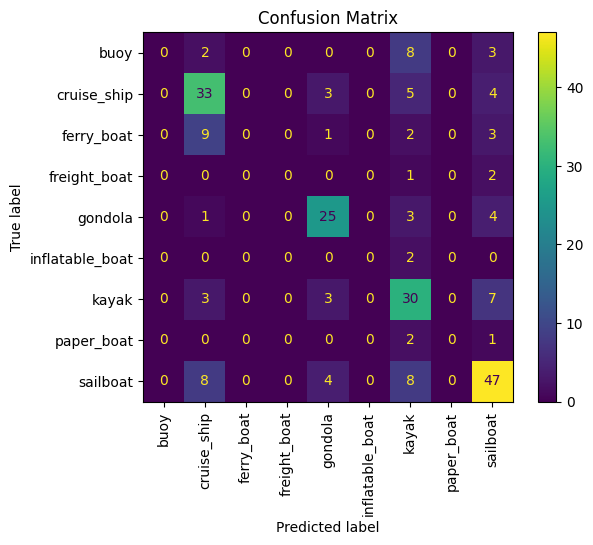

In [ ]:
display_cm(true_labels,predicted_labels)

As expected Sailboat,Kayak,Gondola and Cruise ship has high true positive values because of large number of images in the training data. Most mis-classifications are seen in the other image classes

##Classification Report

In [ ]:
cl_report = classification_report(true_labels,predicted_labels)
print(cl_report)

print('Index to name mapping:\n')

for k,v in class_dict.items():
    print(f'{k} - > {v}')

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.59      0.73      0.65        45
           2       0.00      0.00      0.00        15
           3       0.00      0.00      0.00         3
           4       0.69      0.76      0.72        33
           5       0.00      0.00      0.00         2
           6       0.49      0.70      0.58        43
           7       0.00      0.00      0.00         3
           8       0.66      0.70      0.68        67

    accuracy                           0.60       224
   macro avg       0.27      0.32      0.29       224
weighted avg       0.51      0.60      0.55       224

Index to name mapping:

0 - > inflatable_boat
1 - > freight_boat
2 - > paper_boat
3 - > buoy
4 - > ferry_boat
5 - > cruise_ship
6 - > gondola
7 - > kayak
8 - > sailboat


As expected the classes with higher support have the better overall scores

#Transfer Learning with MobileNet application

##Import mobilenet_v2 and freeze the weights

In [ ]:
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
mob_model = tf.keras.applications.MobileNet(
    input_shape=(height,width,3),
    include_top=False,
    weights="imagenet",
    input_tensor=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax",
    name='MobileNet',

)
mob_model.trainable=False
mob_model.summary()


17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "MobileNet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1 (Conv2D)                       │ (None, 112, 112, 32)        │             864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_bn (BatchNormalization)        │ (None, 112, 112, 32)        │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_relu (ReLU)                    │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1 (DepthwiseConv2D)          │ (None, 112, 112, 32)        │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_bn (BatchNormalization)    │ (None, 112, 112, 32)        │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_relu (ReLU)                │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1 (Conv2D)                   │ (None, 112, 112, 64)        │           2,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_bn (BatchNormalization)    │ (None, 112, 112, 64)        │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_relu (ReLU)                │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pad_2 (ZeroPadding2D)           │ (None, 113, 113, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2 (DepthwiseConv2D)          │ (None, 56, 56, 64)          │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_bn (BatchNormalization)    │ (None, 56, 56, 64)          │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_relu (ReLU)                │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2 (Conv2D)                   │ (None, 56, 56, 128)         │           8,192 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_bn (BatchNormalization)    │ (None, 56, 56, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_relu (ReLU)                │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3 (DepthwiseConv2D)          │ (None, 56, 56, 128)         │           1,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_bn (BatchNormalization)    │ (None, 56, 56, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_relu (ReLU)                │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_3 (Conv2D)                   │ (None, 56, 56, 128)         │          16,384 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 3,228,864 (12.32 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 3,228,864 (12.32 MB)

##Build an FCN

##Get training and validation set at 70:30 ratio and seed 1

In [ ]:
train_ds = get_ds(data_dir,validation_split=0.3,subset='training',seed = 1,image_size=(height,width),batch_size=batch_size)
val_ds = get_ds(data_dir,validation_split=0.3,subset='validation',seed = 1,image_size=(height,width),batch_size=batch_size)

Found 1162 files belonging to 9 classes.
Using 814 files for training.
Found 1162 files belonging to 9 classes.
Using 348 files for validation.


##Set up dataset with caching and prefetch

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

##Add a FCN to the mobile net model(no data augmentation)

In [ ]:

model_t = create_transfer_model(mob_model)
model_t.name = 'Transfer_Model'


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ rescaling_2 (Rescaling)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ MobileNet (Functional)               │ (None, 7, 7, 1024)          │       3,228,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_2           │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 256)                 │         262,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 9)                   │           1,161 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,526,857 (13.45 MB)

 Trainable params: 297,225 (1.13 MB)

 Non-trainable params: 3,229,632 (12.32 MB)

##Complile the model

In [ ]:
model_t.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
print('model_t compiled')

model_t compiled


##Configure for early stopping and Checkpoint and train the model

In [ ]:

early_stop=EarlyStopping(monitor='val_accuracy',mode='max',verbose=1,patience=10,min_delta=0.01)
checkpoint=ModelCheckpoint('best_model_t.keras',monitor='val_accuracy',mode='max',verbose=1,save_best_only=True)

epochs=100
history_t = model_t.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  batch_size = batch_size,
  callbacks = [early_stop,checkpoint]
)

histories.append(history_t)

Epoch 1/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.4264 - loss: 1.8711
Epoch 1: val_accuracy improved from -inf to 0.67529, saving model to best_model_t.keras
26/26 ━━━━━━━━━━━━━━━━━━━━ 28s 513ms/step - accuracy: 0.4328 - loss: 1.8516 - val_accuracy: 0.6753 - val_loss: 1.0619
Epoch 2/100
25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.8425 - loss: 0.5144
Epoch 2: val_accuracy improved from 0.67529 to 0.77874, saving model to best_model_t.keras
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - accuracy: 0.8447 - loss: 0.5084 - val_accuracy: 0.7787 - val_loss: 0.7892
Epoch 3/100
24/26 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.9499 - loss: 0.2008
Epoch 3: val_accuracy improved from 0.77874 to 0.80172, saving model to best_model_t.keras
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - accuracy: 0.9506 - loss: 0.2012 - val_accuracy: 0.8017 - val_loss: 0.6515
Epoch 4/100
25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.9720 - loss: 0.1307
Epoch 4: val_accuracy improved from

##Print metrics

In [ ]:
from tensorflow.keras.models import load_model
model_t = load_model('best_model_t.keras')
print_scores(model_t,val_ds,train_ds,'Transfer Model')

Displaying accuracy and loss for Transfer Model
Test loss:0.5267
Test accuracy:0.8621
Train loss:0.0102
train accuracy:0.9988


Severe overfitting can be observed. We will modify this model by increasing dropouts. The below model uses a droput that i have arrived at after trial and error which produced lesser overfitting

##Dropout adjusted Transfer Model(no augmentation)


In [ ]:
model_t1 = create_transfer_model(mob_model,dropout=0.4)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ rescaling_3 (Rescaling)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ MobileNet (Functional)               │ (None, 7, 7, 1024)          │       3,228,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_3           │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 256)                 │         262,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 9)                   │           1,161 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,526,857 (13.45 MB)

 Trainable params: 297,225 (1.13 MB)

 Non-trainable params: 3,229,632 (12.32 MB)

##Compile the model

In [ ]:
model_t1.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
print('model_t1 compiled')

model_t1 compiled


##Train the model

In [ ]:
early_stop=EarlyStopping(monitor='val_accuracy',mode='max',verbose=1,patience=10,min_delta=0.01)
checkpoint=ModelCheckpoint('best_model_t1.keras',monitor='val_accuracy',mode='max',verbose=1,save_best_only=True)

epochs=100
history_t1 = model_t1.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  batch_size = batch_size,
  callbacks = [early_stop,checkpoint]
)

histories.append(history_t1)

Epoch 1/100
25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - accuracy: 0.2050 - loss: 2.7388
Epoch 1: val_accuracy improved from -inf to 0.52874, saving model to best_model_t1.keras
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 313ms/step - accuracy: 0.2133 - loss: 2.7025 - val_accuracy: 0.5287 - val_loss: 1.4464
Epoch 2/100
25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5586 - loss: 1.4237
Epoch 2: val_accuracy improved from 0.52874 to 0.70977, saving model to best_model_t1.keras
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - accuracy: 0.5644 - loss: 1.4091 - val_accuracy: 0.7098 - val_loss: 1.0327
Epoch 3/100
25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.7462 - loss: 0.8408
Epoch 3: val_accuracy improved from 0.70977 to 0.76724, saving model to best_model_t1.keras
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - accuracy: 0.7441 - loss: 0.8477 - val_accuracy: 0.7672 - val_loss: 0.8145
Epoch 4/100
25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.8037 - loss: 0.6875
Epoch 4: val_accuracy improved f

##Print metrics

In [ ]:
from tensorflow.keras.models import load_model
model_t1 = load_model('best_model_t1.keras')
print_scores(model_t1,val_ds,train_ds,'Dropout Adjusted Transfer Model')
# plot_accuracy_loss_graphs(history_t1,'Dropout adjusted transfer model')

Displaying accuracy and loss for Dropout Adjusted Transfer Model
Test loss:0.5220
Test accuracy:0.8592
Train loss:0.0325
train accuracy:0.9963


Increaing dropout to 0.4 has reduced overfitting a little

##Augmented Transfer Model

In [ ]:
data_augmentation = [layers.RandomFlip("horizontal",input_shape=(height,width,3)),layers.RandomRotation(0.1),layers.RandomZoom(0.1)]
model_augmented = create_transfer_model(mob_model,dropout=0.4,data_augmentation=data_augmentation)

added <RandomFlip name=random_flip, built=False> to model
added <RandomRotation name=random_rotation, built=False> to model
added <RandomZoom name=random_zoom, built=False> to model


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ random_flip (RandomFlip)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation (RandomRotation)     │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom (RandomZoom)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling_4 (Rescaling)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ MobileNet (Functional)               │ (None, 7, 7, 1024)          │       3,228,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_4           │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 256)                 │         262,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_13 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 9)                   │           1,161 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,526,857 (13.45 MB)

 Trainable params: 297,225 (1.13 MB)

 Non-trainable params: 3,229,632 (12.32 MB)

##Compile the model

In [ ]:
model_augmented.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
print('model_augmented compiled')

model_augmented compiled


##Train the model

In [ ]:
early_stop=EarlyStopping(monitor='val_accuracy',mode='max',verbose=1,patience=10,min_delta=0.01)
checkpoint=ModelCheckpoint('best_model_a.keras',monitor='val_accuracy',mode='max',verbose=1,save_best_only=True)

epochs=100
history_a = model_augmented.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  batch_size = batch_size,
  callbacks = [early_stop,checkpoint]
)

histories.append(history_a)

Epoch 1/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.1796 - loss: 2.9263
Epoch 1: val_accuracy improved from -inf to 0.49425, saving model to best_model_a.keras
26/26 ━━━━━━━━━━━━━━━━━━━━ 11s 143ms/step - accuracy: 0.1832 - loss: 2.9111 - val_accuracy: 0.4943 - val_loss: 1.5626
Epoch 2/100
25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - accuracy: 0.4971 - loss: 1.6661
Epoch 2: val_accuracy improved from 0.49425 to 0.67529, saving model to best_model_a.keras
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - accuracy: 0.4999 - loss: 1.6569 - val_accuracy: 0.6753 - val_loss: 1.2297
Epoch 3/100
25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.6437 - loss: 1.1335
Epoch 3: val_accuracy improved from 0.67529 to 0.72126, saving model to best_model_a.keras
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - accuracy: 0.6434 - loss: 1.1357 - val_accuracy: 0.7213 - val_loss: 0.9651
Epoch 4/100
25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.6995 - loss: 1.0396
Epoch 4: val_accuracy improved from 

##Print accuracy and loss curves

In [ ]:
from tensorflow.keras.models import load_model
model_a = load_model('best_model_a.keras')
print_scores(model_t1,val_ds,train_ds,'Augmented Transfer Model')
# plot_accuracy_loss_graphs(history_a,'Augmented transfer model')

Displaying accuracy and loss for Augmented Transfer Model
Test loss:0.5220
Test accuracy:0.8592
Train loss:0.0325
train accuracy:0.9963


##Plot loss/accuracy curves for all models

The final accuracy and loss are the same for augmented ad non augmented models. The augmented model has a slightly lesser ovetfitting

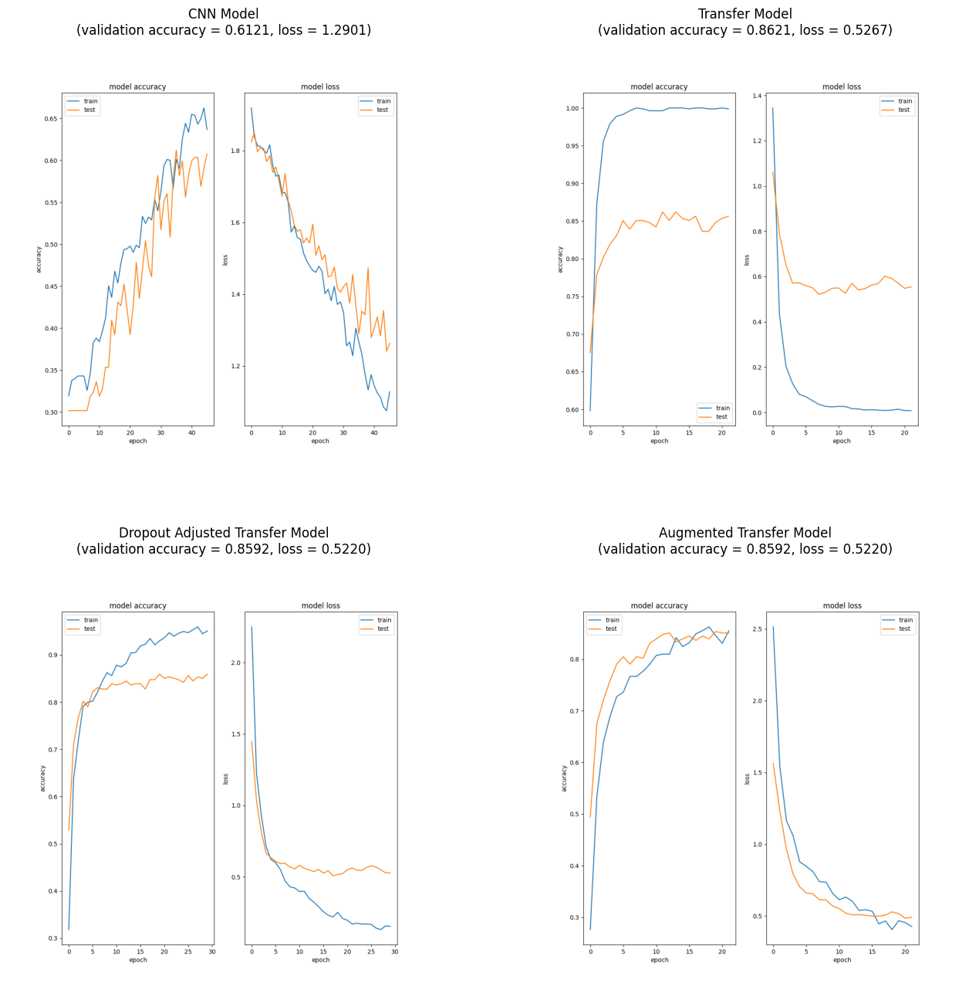

In [ ]:
import matplotlib.image as mpimg
histories = [history_c,history_t,history_t1,history_a]
#titles = ['CNN Model','Transfer Learning model using MobileNet','Dropout adjusted transfer model','Augmented transfer model']
#print(test_accuracy.keys())

titles = list(test_accuracy.keys())

for i,history in enumerate(histories):
  plot_accuracy_loss_graphs(history,titles[i],show=False)
plt.figure(figsize=(16,16))
for i,title in enumerate(titles):
  title = titles[i]
  plt.subplot(2,2,i+1)
  figure = title+'.png'
  img = mpimg.imread(figure)
  plt.imshow(img)
  plt.axis('off')
  accuracy =  test_accuracy[title]
  loss = test_loss[title]
  title = title + f'\n(validation accuracy = {accuracy:.4f}, loss = {loss:.4f})'
  plt.title(title)
plt.show()


##Visualize the predictions

size of image map =  300
Predictions for Transfer Learning model using MobileNet. Title is the prediction



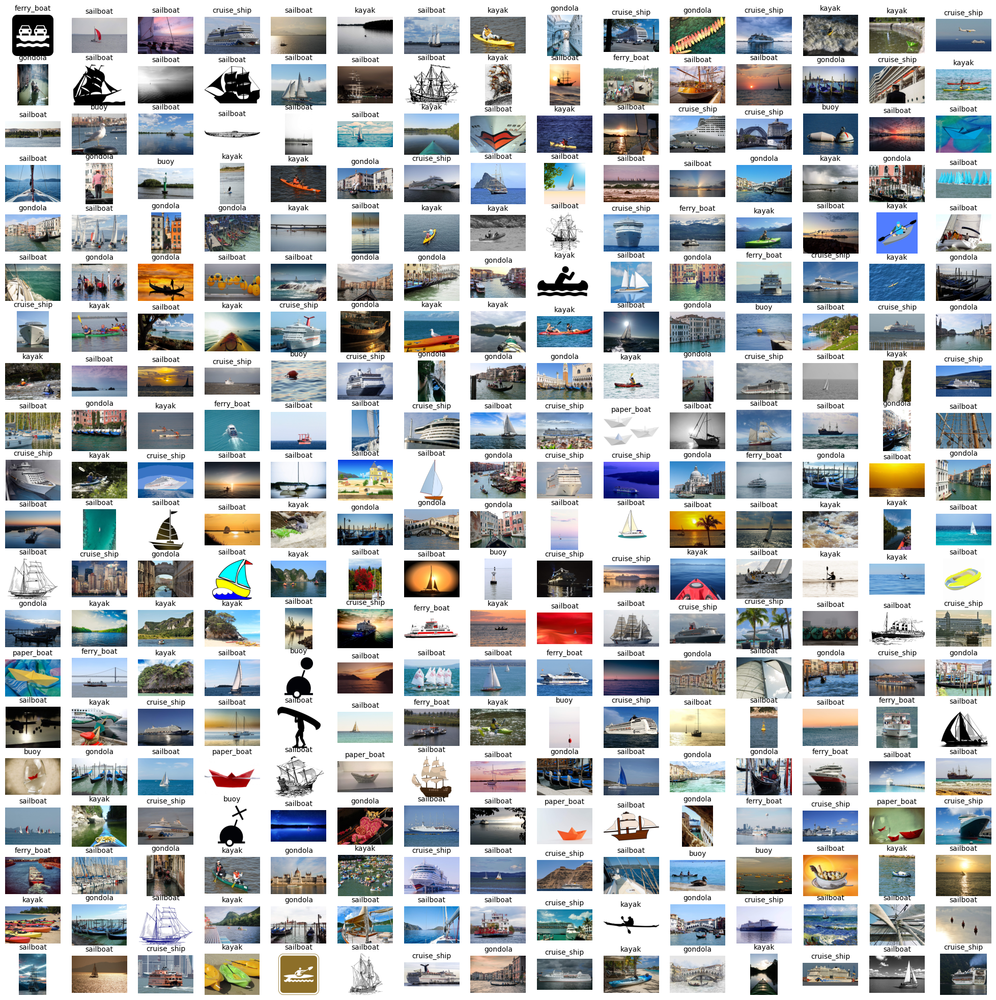

In [ ]:
image_map = get_predicted_labels(model_a,class_names)
print('size of image map = ',len(image_map))
display_test_images(image_map,'Transfer Learning model using MobileNet. Title is the prediction')

**The predictions with the transfer model is much more accurate ( expected as accuracy is 86% ) when commpared to the CNN model. We can see that even classes with very few train images have been correctly identified(paper boat for example)**

##Metrics

In [ ]:

true_labels, predicted_labels = get_metrics(model_a,val_ds,val_split=0.3)

##Confusion Matrix

Confusion Matrix
[[  6   0   0   0   0   0   2   0   4]
 [  1  43   1   0   0   0   1   0   5]
 [  0   4  10   0   1   0   1   0   1]
 [  0   1   1   1   0   0   0   0   5]
 [  0   0   0   0  49   0   1   0   1]
 [  0   0   0   0   0   1   3   0   0]
 [  1   0   0   0   2   0  59   0   5]
 [  0   0   0   0   0   0   1   3   4]
 [  1   0   0   0   1   0   0   0 100]]

Confusion Matrix Displayed



<Figure size 1000x1000 with 0 Axes>

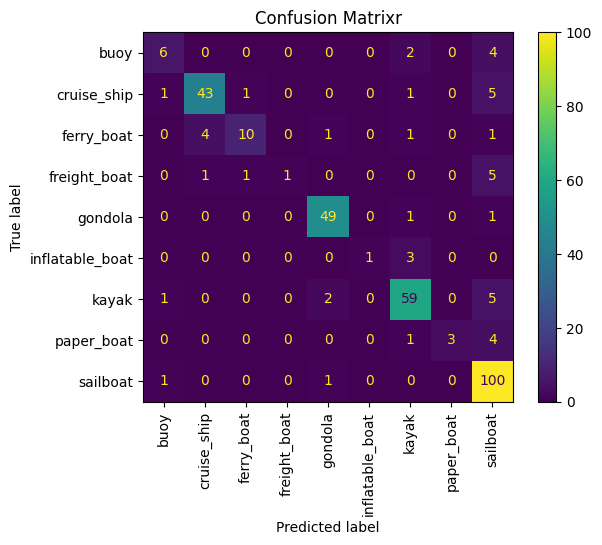

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
cm = confusion_matrix(true_labels,predicted_labels)
print('Confusion Matrix')
print(cm)
print()

print('Confusion Matrix Displayed\n')
plt.figure(figsize = (10,10))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=class_names)
disp.plot()
plt.title('Confusion Matrixr')
plt.xticks(rotation=90)
plt.show()

##Classification Report

In [ ]:
from sklearn.metrics import classification_report

class_name_dict = {
    0 : ''
}

cl_report = classification_report(true_labels,predicted_labels)
print(cl_report)

print('Index to name mapping:\n')

for k,v in class_dict.items():
    print(f'{k} - > {v}')

              precision    recall  f1-score   support

           0       0.67      0.50      0.57        12
           1       0.90      0.84      0.87        51
           2       0.83      0.59      0.69        17
           3       1.00      0.12      0.22         8
           4       0.92      0.96      0.94        51
           5       1.00      0.25      0.40         4
           6       0.87      0.88      0.87        67
           7       1.00      0.38      0.55         8
           8       0.80      0.98      0.88       102

    accuracy                           0.85       320
   macro avg       0.89      0.61      0.67       320
weighted avg       0.86      0.85      0.83       320

Index to name mapping:

0 - > inflatable_boat
1 - > freight_boat
2 - > paper_boat
3 - > buoy
4 - > ferry_boat
5 - > cruise_ship
6 - > gondola
7 - > kayak
8 - > sailboat


As expected the classes that have higher support(more train images) have better overall scores

# Inferences






##CNN Model

The CNN model built in part 1 of this project gave an accuracy of around 65%. When tested on the 300 test images, we could see many mis-classificatons. This could be because the training set contained just 1162 images and the code used only 80% of that for training. This is a very low number for the model to learn well.  The model has a bit of overfitting, though :

##Transfer Learning

Accuracy significantly increases with transfer model (Mobilenet_V2) with fine tuning with custom FCN. However there is significant over fitting with low dropout values.<p>
With higher dropout values, overfitting gets reduced without sacrificing accuracy<p>
Higher dropout value with additional image augmentation reduces overfitting further at every epoch without compromising accuracy<p>
The higher accuracy is evident in the number of correct predictions.  This can also be seen in the confusion matrix and classification report. This has been verified visually too on the unlabelled test data set



##Conclusion

For custom daasets that do not have sufficiently large number of images, transfer learning is the preferred method of choice. By freezing the model's weights and then fine tuning with a fully connected layer gives us a very accurrate model that otherwise would not have been possible.